# Optimization Benchmark given different Perturbation to the Original Field
Ported from MATLAB: spectral_main.m + 6 helper .m files.

All operations are 2D spectral (surface only).
Uses JAX for JIT compilation, GPU acceleration, and auto-differentiation.

In [ ]:
# Packages

import jax
# Enable 64-bit
jax.config.update("jax_enable_x64", True)
import jax.numpy as jnp
from jax import jit
import jaxopt
import matplotlib
# matplotlib.use('Agg')          # headless, no Tk
import matplotlib.pyplot as plt
import numpy as np
import os
import time
import tkinter as tk
from tkinter import filedialog
import scipy.io as sio
import sys
import dill
import inspect

# For fourier transform
from numpy.fft import rfft2, irfft2

# Input subfiles
%reload_ext autoreload
%autoreload 2

sys.path.insert(0, os.path.join(os.path.dirname(os.path.abspath("__file__")), '..'))
from physics_functions import calculate_surface_u, forward_ssh
from cost_functions import cost_function_fmin
from ssh_setup import ssh_setup


# print(inspect.getsource(perturb_C2_cutoff))



In [69]:
# # Reload data

# with open('workspace_0412_afternoon.pkl', 'rb') as f:
#     ws = dill.load(f)
# globals().update(ws)

# %matplotlib inline
# import matplotlib.pyplot as plt

# Reload workspace from a .pkl file — pick via dialog and print its structure

import dill
import tkinter as tk
from tkinter import filedialog
import numpy as np

root = tk.Tk(); root.withdraw(); root.attributes("-topmost", True)
pkl_path = filedialog.askopenfilename(
    title="Select a workspace .pkl file to load",
    filetypes=[("Pickle files", "*.pkl"), ("All files", "*.*")],
)
root.destroy()

if not pkl_path:
    print("No file selected.")
else:
    with open(pkl_path, 'rb') as f:
        ws = dill.load(f)
    print(f"Loaded: {pkl_path}\n")

    def describe(value):
        """Return a short string describing the type/shape of a value."""
        if isinstance(value, np.ndarray):
            return f"ndarray  shape={value.shape}  dtype={value.dtype}"
        if hasattr(value, 'shape') and hasattr(value, 'dtype'):  # jax arrays, etc.
            return f"{type(value).__name__}  shape={tuple(value.shape)}  dtype={value.dtype}"
        if isinstance(value, dict):
            return f"dict  (len={len(value)})"
        if isinstance(value, (list, tuple)):
            return f"{type(value).__name__}  (len={len(value)})"
        if isinstance(value, (int, float, complex, bool, str)):
            return f"{type(value).__name__} = {value!r}"
        return type(value).__name__

    print(f"Top-level keys ({len(ws)}):")
    print("-" * 72)
    for k, v in ws.items():
        print(f"  {k:<22}  {describe(v)}")

    # Drill one level into dicts (cases, benchmark_results, phi0_s_optimals, ...)
    print("\nNested structure (one level deep):")
    print("-" * 72)
    for k, v in ws.items():
        if isinstance(v, dict) and len(v) > 0:
            print(f"\n  {k}:")
            for sub_k, sub_v in v.items():
                if isinstance(sub_v, tuple):
                    inner = ", ".join(describe(x) for x in sub_v)
                    print(f"    {sub_k:<22}  tuple({inner})")
                elif isinstance(sub_v, dict):
                    inner_keys = ", ".join(sub_v.keys())
                    print(f"    {sub_k:<22}  dict  keys=[{inner_keys}]")
                else:
                    print(f"    {sub_k:<22}  {describe(sub_v)}")

    # Inject into globals so the rest of the notebook can use the loaded variables
    globals().update(ws)
    print("\nAll keys injected into globals().")


Loaded: D:/Documents/College/Research/Oceangrophy/Shafer_Project/Output/Benchmark Result/0413/C2_Vary/Run1_Ro_1e-3/workspace_0413_run2_Ro_1e-3.pkl

Top-level keys (21):
------------------------------------------------------------------------
  benchmark_results       dict  (len=4)
  phi0_s_optimals         dict  (len=4)
  cases                   dict  (len=4)
  phi0_s                  ArrayImpl  shape=(128, 128)  dtype=float64
  phi0_s_hat              ArrayImpl  shape=(128, 128)  dtype=complex128
  kx                      ArrayImpl  shape=(128, 128)  dtype=float64
  ky                      ArrayImpl  shape=(128, 128)  dtype=float64
  K                       ArrayImpl  shape=(128, 128)  dtype=float64
  K2                      ArrayImpl  shape=(128, 128)  dtype=float64
  inv_K2                  ArrayImpl  shape=(128, 128)  dtype=float64
  mu                      ArrayImpl  shape=(128, 128)  dtype=float64
  inv_mu                  ArrayImpl  shape=(128, 128)  dtype=float64
  Ro          

# Load the Data and Setup Parameter

In [57]:
# Key Parameters

Ro = 1e-1

In [4]:
import sys

print("Select an SSH data file (.mat)... Press Cancel to use default SSH_setup")
root = tk.Tk()
root.withdraw()

file_path = filedialog.askopenfilename(
    title="Select an SSH data file (.mat)",
    filetypes=[("MATLAB Data Files", "*.mat"), ("All Files", "*.*")]
)

mat_contents = sio.loadmat(file_path)
# Find the relevant array (expecting buoyancy 'bout')
key = 'bout'
b_s_data = mat_contents[key]
b_s = b_s_data[:, :, -1]
print(f"Loaded 3D buoyancy data from {file_path}, using the last period.")

# Normalization
b_s_normalized = b_s / jnp.max(jnp.abs(b_s))

Nx, Ny = b_s_normalized.shape
print(f"Grid size adjusted automatically to Nx={Nx}, Ny={Ny}.")
data_name = os.path.splitext(os.path.basename(file_path))[0]

Select an SSH data file (.mat)... Press Cancel to use default SSH_setup
Loaded 3D buoyancy data from D:/Documents/College/Research/Oceangrophy/Shafer_Project/SQG_Simulations/Shafer Simulation output/20260327_231933_Shafer_Simulation_random_IC/20260327_231933_Shafer_Simulation_random_IC.mat, using the last period.
Grid size adjusted automatically to Nx=128, Ny=128.


In [58]:
# Universal for channel model 

# Lx = Ly = 2 \pi
Lx = 2.0 * jnp.pi
Ly = 2.0 * jnp.pi
# Non-Dimensional Parameters
Bu = 1.0

epsilon = Ro

# Grid Setup. 
dx = Lx / Nx
dy = Ly / Ny
x = jnp.arange(Nx) * dx
y = jnp.arange(Ny) * dy
X, Y = jnp.meshgrid(x, y, indexing='ij')

# Spectral grid
dk = 1.0
dl = 1.0
k_zonal     = jnp.concatenate([jnp.arange(Nx//2), jnp.arange(-Nx//2, 0)]) * dk
l_meridional = jnp.concatenate([jnp.arange(Ny//2), jnp.arange(-Ny//2, 0)]) * dl
k_zonal      = k_zonal.at[Nx//2].set(0.0)      # kill Nyquist
l_meridional = l_meridional.at[Ny//2].set(0.0)
kx, ky = jnp.meshgrid(k_zonal, l_meridional, indexing='ij')

# The square of K
K2 = kx**2 + ky**2
K = jnp.sqrt(K2)

# Safe inverses (avoid division by zero at k=0)
inv_K = jnp.where(K > 0, 1.0 / K, 0.0)
inv_K2 = jnp.where(K2 > 0, 1.0 / K2, 0.0)

# This is for taking derivative in $z$ direction.
mu = jnp.sqrt(Bu) * K
inv_mu = jnp.where(mu > 0, 1.0 / mu, 0.0)


# Non-Dimensionalization

In Shafer Simulation, everything is already non-dimensional.

I see $ L = 2 \pi$ grid size varies from $n = 64$ to $n = 128$ and $n = 256$. The peak wavenumber is $K_0 = 9.5$. 

# True Sea Surface Height

From the Simulation, we have surface buoyancy $b^s$. Under non-dimensionalized setting, 

$$ b^s = \frac{\partial \psi}{\partial z} \Big|_{z = 0} $$

Then undere QG setting, 

$$ \eta^s = \psi^s $$

# Target Field

Now the Target Surface Sea Height should perhaps be the qg streamfunction adding the ageostrophic correction. That is 

$$ \eta_{tar} = \eta_{qg} + \epsilon \cdot \eta^1 $$

So a forward here is perform to generate the target field


In [59]:
# Surface Streamfunction
b_s_hat = jnp.fft.fft2(b_s_normalized)
phi0_s_hat = b_s_hat * inv_mu
phi0_s = jnp.real(jnp.fft.ifft2(phi0_s_hat))

# Surface Sea height, true data
ssh_qg = phi0_s
ssh_qg_hat = phi0_s_hat

# import
from physics_functions import cyclogeo_term, vorticity_term, forward_ssh

eta_tar_hat = forward_ssh(ssh_qg_hat, kx, ky, mu, inv_mu, K2, inv_K2, Bu, epsilon)

# Revert to Physical Space
eta_tar = jnp.real(jnp.fft.ifft2(eta_tar_hat))

In [60]:
def compute_zeta_from_phi(phi_hat):
    """Compute surface velocity and vorticity from a streamfunction in spectral space."""
    u, v = calculate_surface_u(phi_hat, mu, inv_mu, kx, ky, K2, inv_K2, epsilon, Bu)
    zeta = jnp.real(jnp.fft.ifft2(
        1j * kx * jnp.fft.fft2(v) - 1j * ky * jnp.fft.fft2(u)
    ))
    return u, v, zeta

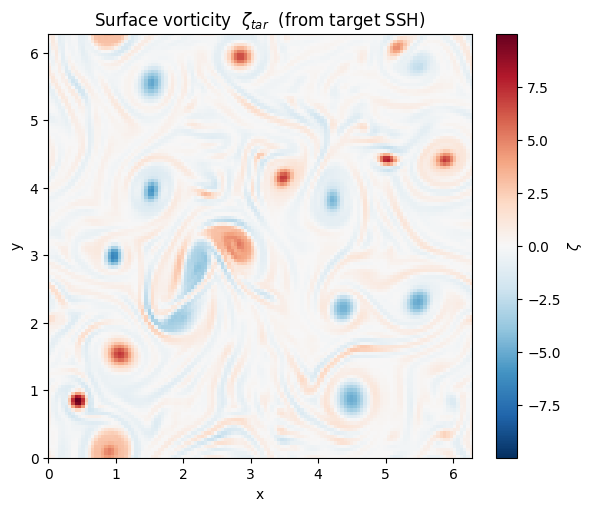

In [42]:
# ── Surface vorticity of the target SSH (QG truth) ───────────────────────────
_, _, zeta_obs = compute_zeta_from_phi(phi0_s_hat)

vmax_z = float(jnp.max(jnp.abs(zeta_obs)))

fig, ax = plt.subplots(figsize=(6, 5), constrained_layout=True)
im = ax.imshow(zeta_obs, origin='lower', cmap='RdBu_r',
               vmin=-vmax_z, vmax=vmax_z,
               extent=[0, float(Lx), 0, float(Ly)])
ax.set_title(r"Surface vorticity  $\zeta_{tar}$  (from target SSH)")
ax.set_xlabel("x"); ax.set_ylabel("y")
plt.colorbar(im, ax=ax, fraction=0.046, label=r"$\zeta$")
plt.show()


# Build the Perturbed Surface Sea Height

In [61]:
# Input subfiles
%reload_ext autoreload
%autoreload 2

from perturbation_setup_v2 import build_all_perturbations, print_rms_table
from perturbation_setup_C2 import build_C2_perturbations, print_rms_table as print_C2_table
from perturbation_setup_C1 import build_C1_perturbations, print_rms_table as print_C1_table
from perturbation_setup_C3 import build_C3_perturbations, print_rms_table as print_C3_table

rng_key = jax.random.PRNGKey(42)

# cases = build_all_perturbations(
#     eta_tar, eta_tar_hat, kx, ky, K, K2, inv_K2,
#     mu, inv_mu, Bu, Ro, X, Y, Lx, Ly, rng_key
# )

# For C1 case specifically
# cases = build_C1_perturbations(eta_tar, K, Ro, rng_key)
# print_C1_table(cases, eta_tar, Ro)

# For C2 case specifically
cases = build_C2_perturbations(eta_tar, K, Ro, rng_key)
print_C2_table(cases, eta_tar, Ro)

# For C3 case
# cases = build_C3_perturbations(eta_tar, K, Ro, rng_key)
# print_C3_table(cases, eta_tar, Ro)



print(f"  max |phi0_s|     = {jnp.max(jnp.abs(phi0_s)):.6f}")
print()

for name, (eta_perturb, eta_obs) in cases.items():
    print(f"[{name}]")
    print(f"  max |perturb|  = {jnp.max(jnp.abs(eta_perturb)):.6f}")
    print(f"  max |eta_obs| = {jnp.max(jnp.abs(eta_obs)):.6f}")
    print(f"  ratio (perturb / phi0_s) = {jnp.max(jnp.abs(eta_perturb)) / jnp.max(jnp.abs(phi0_s)):.4f}")
    print()

  signal rms(eta_tar)   = 0.057327
  target rms(perturb)   = Ro * rms(eta_tar) = 0.005733

  Case                        rms(perturb)   ratio to target
  ------------------------------------------------------------
  C1_kcut_10                      0.005733            1.0000
  C1_kcut_15                      0.005733            1.0000
  C1_kcut_20                      0.005733            1.0000
  C1_kcut_30                      0.005733            1.0000
  max |phi0_s|     = 0.214354

[C1_kcut_10]
  max |perturb|  = 0.020478
  max |eta_obs| = 0.302347
  ratio (perturb / phi0_s) = 0.0955

[C1_kcut_15]
  max |perturb|  = 0.022000
  max |eta_obs| = 0.296056
  ratio (perturb / phi0_s) = 0.1026

[C1_kcut_20]
  max |perturb|  = 0.024398
  max |eta_obs| = 0.302196
  ratio (perturb / phi0_s) = 0.1138

[C1_kcut_30]
  max |perturb|  = 0.024290
  max |eta_obs| = 0.301111
  ratio (perturb / phi0_s) = 0.1133



In [62]:
print(Ro)

0.1


# Inversion Part

First setup the initial guess field. The initial guess should be the QG surface streamfunction which is the same as QG surface sea height

In [63]:
# Initial Guess

phi0_s_guess = ssh_qg # The initial guess is just the surface streamfunction

In [64]:
# ── Benchmark: Inversion across all perturbation cases ──

num_iterations = 10000
loss_threshold = 1e-5 * Ro ** 2
print(loss_threshold)
grad_threshold = 1e-2 * Ro ** 2
log_every      = 1000
stagnation_ratio = 0.99  # break if loss_new / loss_prev > this ratio over log_every steps

# Storage for results
benchmark_results = {}   # {name: {iters, elapsed, final_loss, final_grad, loss_history}}
phi0_s_optimals   = {}   # {name: (Nx, Ny) optimal streamfunction}

phi0_flat_guess = phi0_s_guess.ravel()

# Define loss/grad ONCE — pass target as argument so JAX compiles only once
@jit
def loss_fn(phi0_flat, target):
    phi0_2d = phi0_flat.reshape(Nx, Ny)
    return cost_function_fmin(
        phi0_2d, kx, ky, mu, inv_mu, Bu, epsilon, K2, inv_K2, target
    )

grad_fn = jit(jax.grad(loss_fn))

# cases[name] = (perturbation, eta_obs) where eta_obs = ssh_qg + perturbation
# (both in physical space; see build_all_perturbations with perturb_streamfunction=False)
for case_name, (perturb, eta_obs) in cases.items():
    print(f"\n{'='*60}")
    print(f"  Case: {case_name}")
    print(f"{'='*60}")

    # Loss function expects the SSH target in spectral space
    eta_s_hat_obs = jnp.fft.fft2(eta_obs)

    solver = jaxopt.LBFGS(fun=loss_fn, maxiter=num_iterations, tol=1e-8)
    state  = solver.init_state(phi0_flat_guess, eta_s_hat_obs)
    params = phi0_flat_guess

    loss_history = []
    t0 = time.time()
    converged_iter = num_iterations
    prev_checkpoint_loss = None

    for it in range(num_iterations):
        params, state = solver.update(params, state, eta_s_hat_obs)
        loss_val = float(loss_fn(params, eta_s_hat_obs))
        g_norm = float(jnp.linalg.norm(grad_fn(params, eta_s_hat_obs)))
        loss_history.append(loss_val)

        if (it + 1) % log_every == 0 or it == 0:
            print(f"  Iter {it+1:5d} | Loss = {loss_val:.6e} | |grad| = {g_norm:.6e}")
            if prev_checkpoint_loss is not None and prev_checkpoint_loss > 0:
                ratio = loss_val / prev_checkpoint_loss
                if ratio > stagnation_ratio:
                    print(f"  ** Stagnated at iter {it+1}  (loss ratio = {ratio:.6f} > {stagnation_ratio})")
                    converged_iter = it + 1
                    break
            prev_checkpoint_loss = loss_val

        if loss_val < loss_threshold:
            print(f"  ** Converged (loss) at iter {it+1}  (Loss = {loss_val:.6e}, |grad| = {g_norm:.6e})")
            converged_iter = it + 1
            break

        if g_norm < grad_threshold:                                             # ← add this block
            print(f"  ** Converged (|grad|) at iter {it+1}  (Loss = {loss_val:.6e}, |grad| = {g_norm:.6e})")
            converged_iter = it + 1
            break

    elapsed = time.time() - t0

    phi0_s_optimals[case_name] = params.reshape(Nx, Ny)
    benchmark_results[case_name] = {
        'iters':        converged_iter,
        'elapsed':      elapsed,
        'final_loss':   loss_val,
        'final_grad':   float(jnp.linalg.norm(grad_fn(params, eta_s_hat_obs))),
        'loss_history': loss_history,
    }

    print(f"  Done: {converged_iter} iters, {elapsed:.1f}s, final loss = {loss_val:.4e}")

print("\n\nAll cases complete.")


1.0000000000000002e-07

  Case: C1_kcut_10
  Iter     1 | Loss = 5.724400e-01 | |grad| = 9.155943e+02
  Iter  1000 | Loss = 1.583599e-01 | |grad| = 4.897976e+02
  Iter  2000 | Loss = 1.879789e-02 | |grad| = 1.103332e+02
  Iter  3000 | Loss = 7.418841e-03 | |grad| = 1.285839e+01
  Iter  4000 | Loss = 5.583535e-03 | |grad| = 9.591060e+00
  Iter  5000 | Loss = 4.981193e-03 | |grad| = 7.971682e+00
  Iter  6000 | Loss = 4.454279e-03 | |grad| = 2.382995e+01
  Iter  7000 | Loss = 4.165274e-03 | |grad| = 9.375973e+00
  Iter  8000 | Loss = 3.730233e-03 | |grad| = 6.981485e+00
  Iter  9000 | Loss = 3.618845e-03 | |grad| = 7.605440e+00
  Iter 10000 | Loss = 3.515179e-03 | |grad| = 1.239403e+00
  Done: 10000 iters, 200.2s, final loss = 3.5152e-03

  Case: C1_kcut_15
  Iter     1 | Loss = 5.571780e-01 | |grad| = 6.487308e+02
  Iter  1000 | Loss = 3.076413e-01 | |grad| = 4.075487e+02
  Iter  2000 | Loss = 8.006938e-02 | |grad| = 1.867240e+02
  Iter  3000 | Loss = 2.716094e-02 | |grad| = 6.556233e+01

# Now plot the Result

Case                           Init Loss   Iters   Time (s)     Final Loss   Final |grad|
------------------------------------------------------------------------------------------
C1_kcut_10                    5.8392e-05   10000      194.5     2.6265e-11     4.9415e-05
C1_kcut_15                    5.6835e-05   10000      192.0     1.2814e-11     9.1563e-06
C1_kcut_20                    5.6081e-05    8266      165.5     9.9998e-12     6.0487e-06
C1_kcut_30                    5.5505e-05    9707      186.0     9.9914e-12     7.3614e-06


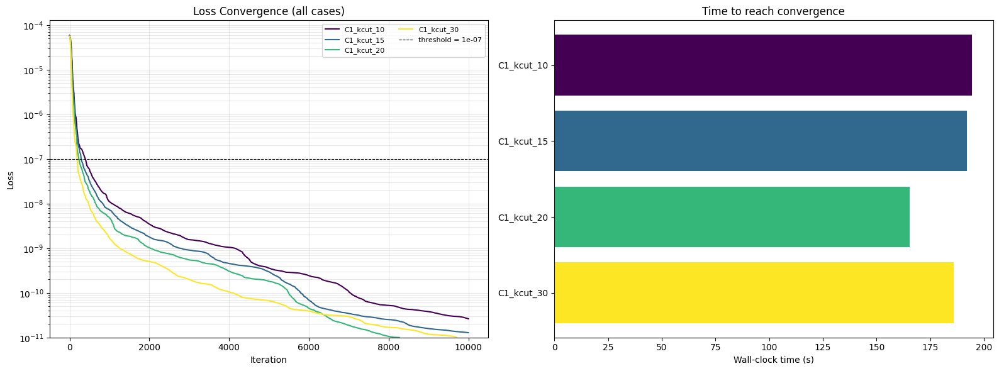

In [71]:
# ── Summary table (with initial loss) ──
print(f"{'Case':<25} {'Init Loss':>14} {'Iters':>7} {'Time (s)':>10} {'Final Loss':>14} {'Final |grad|':>14}")
print("-" * 90)
for name, r in benchmark_results.items():
    init_loss = r['loss_history'][0] if r['loss_history'] else float('nan')
    print(f"{name:<25} {init_loss:>14.4e} {r['iters']:>7d} {r['elapsed']:>10.1f} {r['final_loss']:>14.4e} {r['final_grad']:>14.4e}")

# ── Loss convergence curves (all cases on one plot) ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Dynamic colour assignment: sequential colormap shaded by case order.
# Works for any sweep (C2_kcut_*, C3_slope_*, etc.) — no hardcoding.
case_names = list(benchmark_results.keys())
n_cases    = len(case_names)
cmap       = plt.cm.viridis                       # swap for plasma/Blues/etc. if you prefer
case_colors = {name: cmap(i / max(n_cases - 1, 1))
               for i, name in enumerate(case_names)}

for name, r in benchmark_results.items():
    ax1.semilogy(r['loss_history'], label=name, color=case_colors[name], linewidth=1.5)

ax1.axhline(loss_threshold, color='k', linestyle='--', linewidth=0.8, label=f'threshold = {loss_threshold:.0e}')
ax1.set_xlabel('Iteration')
ax1.set_ylabel('Loss')
ax1.set_title('Loss Convergence (all cases)')
ax1.legend(fontsize=8, ncol=2)
# ax1.set_xscale('log')
ax1.set_ylim(bottom=1e-11)
ax1.grid(True, which='both', alpha=0.3)

# ── Bar chart: wall-clock time to convergence ──
times  = [benchmark_results[n]['elapsed'] for n in case_names]
colors = [case_colors[n] for n in case_names]

ax2.barh(case_names, times, color=colors)
ax2.set_xlabel('Wall-clock time (s)')
ax2.set_title('Time to reach convergence')
ax2.invert_yaxis()

plt.tight_layout()
plt.show()


# Result Analysis

For most of the case, the convergent is really fast. However although the final gradient is near 0, actually the lost function is not. Indicating the SQG+1 model is not capable of reconstructing a surface sea height exactly equals to the perturbed field. This is reasonable since the perturbation we added is not QG. I would compare the SSH_target with the inversed ssh. 

Available cases:
  [0] C2_kcut_5               final_loss = 2.103e-01  |grad| = 4.662e+01
  [1] C2_kcut_6               final_loss = 1.765e-01  |grad| = 5.342e+01
  [2] C2_kcut_7               final_loss = 1.983e-01  |grad| = 4.334e+01
  [3] C2_kcut_8               final_loss = 1.918e-01  |grad| = 6.406e+00
  [4] C2_kcut_9               final_loss = 1.843e-01  |grad| = 4.918e+01
  [5] C2_kcut_10              final_loss = 1.919e-01  |grad| = 1.115e+02
  [6] C2_kcut_11              final_loss = 1.899e-01  |grad| = 2.919e+01
  [7] C2_kcut_12              final_loss = 2.032e-01  |grad| = 2.049e+01

── C2_kcut_5 ──
  rms(target)   = 5.732708e-02
  rms(residual) = 3.919614e-03
  rel error     = 6.8373%


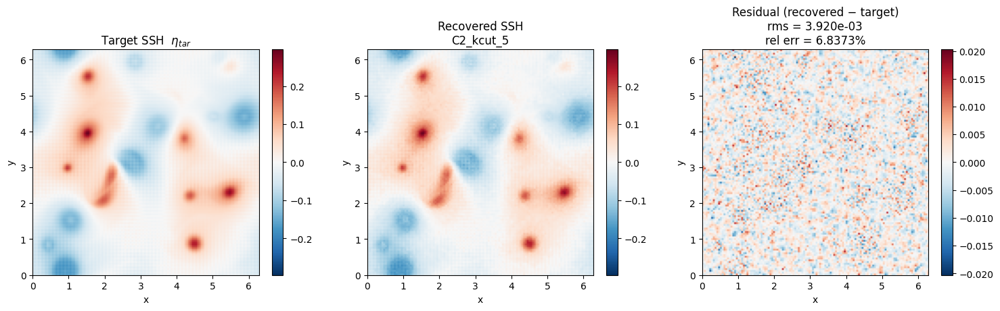

── C2_kcut_6 ──
  rms(target)   = 5.732708e-02
  rms(residual) = 4.441702e-03
  rel error     = 7.7480%


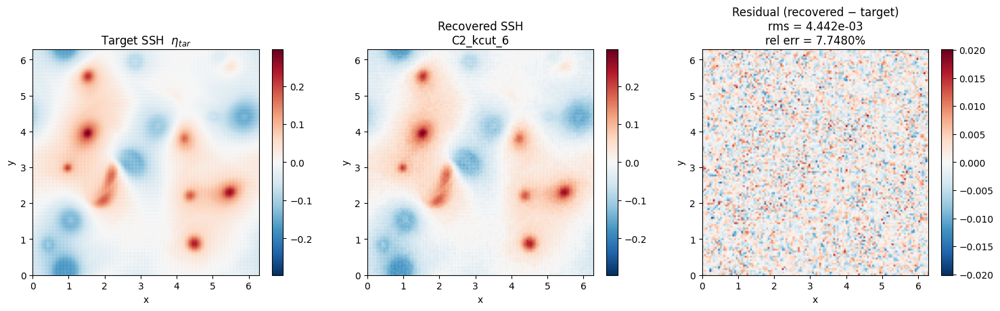

── C2_kcut_7 ──
  rms(target)   = 5.732708e-02
  rms(residual) = 3.979849e-03
  rel error     = 6.9424%


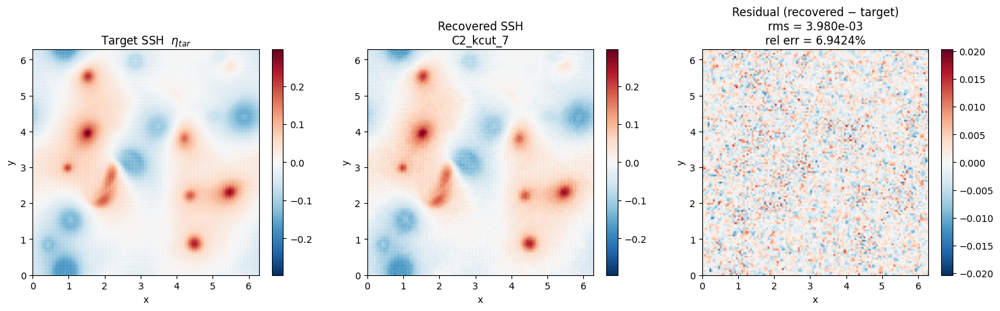

── C2_kcut_8 ──
  rms(target)   = 5.732708e-02
  rms(residual) = 4.193952e-03
  rel error     = 7.3158%


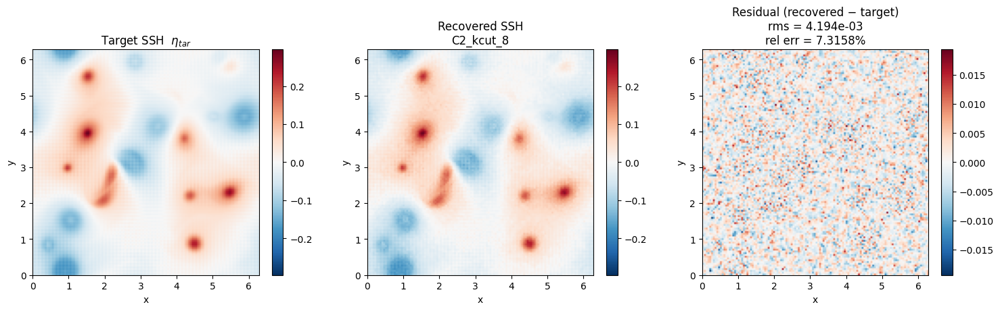

── C2_kcut_9 ──
  rms(target)   = 5.732708e-02
  rms(residual) = 4.178521e-03
  rel error     = 7.2889%


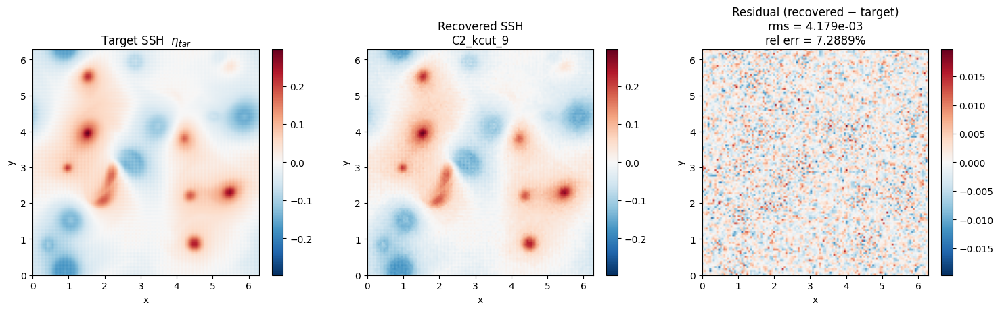

── C2_kcut_10 ──
  rms(target)   = 5.732708e-02
  rms(residual) = 4.220937e-03
  rel error     = 7.3629%


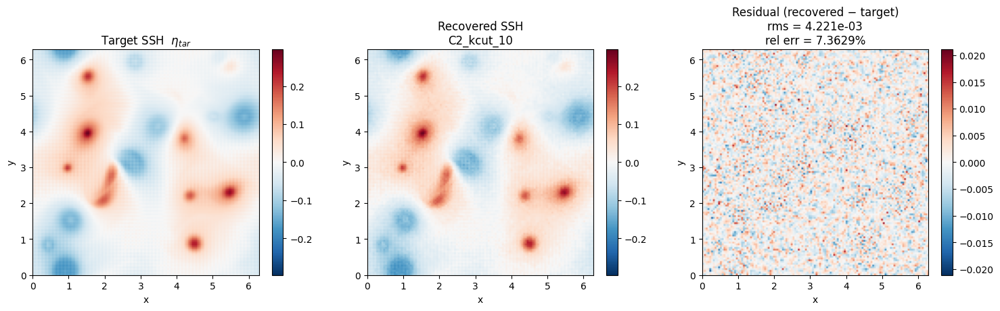

── C2_kcut_11 ──
  rms(target)   = 5.732708e-02
  rms(residual) = 4.295597e-03
  rel error     = 7.4931%


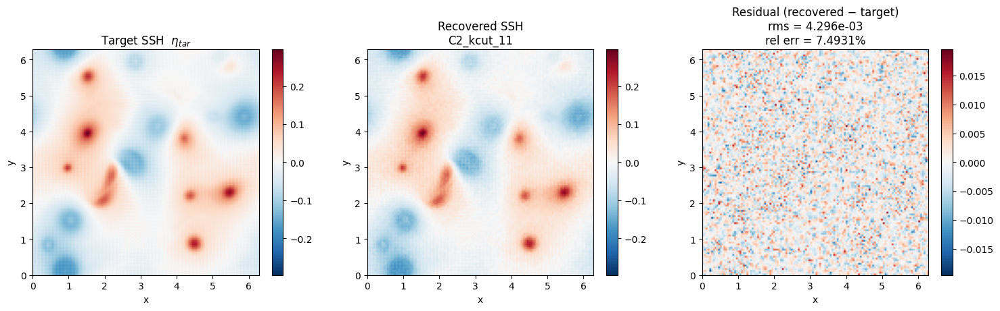

── C2_kcut_12 ──
  rms(target)   = 5.732708e-02
  rms(residual) = 3.961203e-03
  rel error     = 6.9098%


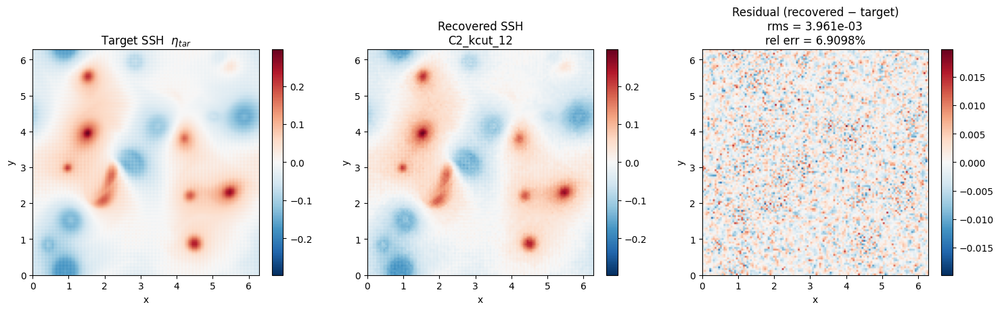

In [37]:
import os
from tkinter import Tk, filedialog

store_all = False

# If store_all, ask for a folder once; otherwise plots just show inline
save_dir = None
if store_all:
    root = Tk(); root.withdraw(); root.attributes("-topmost", True)
    save_dir = filedialog.askdirectory(title="Choose folder to save case plots")
    root.destroy()
    if not save_dir:
        print("No folder selected — plots will be shown but not saved.")
    else:
        os.makedirs(save_dir, exist_ok=True)
        print(f"Saving plots to: {save_dir}\n")

# Summary header
print("Available cases:")
for i, name in enumerate(cases.keys()):
    r = benchmark_results[name]
    print(f"  [{i}] {name:<22}  final_loss = {r['final_loss']:.3e}  |grad| = {r['final_grad']:.3e}")
print()

# Loop over every case
for case_name in cases.keys():
    perturb, eta_obs_phys = cases[case_name]
    phi0_opt = phi0_s_optimals[case_name]

    # Forward SQG+1 SSH from the optimal streamfunction
    phi0_opt_hat = jnp.fft.fft2(phi0_opt)
    eta_opt_hat  = forward_ssh(phi0_opt_hat, kx, ky,
                               mu, inv_mu, K2, inv_K2, Bu, epsilon)
    eta_opt_phys = jnp.real(jnp.fft.ifft2(eta_opt_hat))

    residual     = eta_opt_phys - eta_tar
    rms_target   = float(jnp.sqrt(jnp.mean(eta_tar ** 2)))
    rms_residual = float(jnp.sqrt(jnp.mean(residual ** 2)))
    rel_err      = rms_residual / rms_target if rms_target > 0 else float('nan')

    print(f"── {case_name} ──")
    print(f"  rms(target)   = {rms_target:.6e}")
    print(f"  rms(residual) = {rms_residual:.6e}")
    print(f"  rel error     = {rel_err:.4%}")

    fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), constrained_layout=True)

    vmax = float(jnp.max(jnp.abs(eta_tar)))
    im0 = axes[0].imshow(eta_tar, origin='lower', cmap='RdBu_r',
                         vmin=-vmax, vmax=vmax,
                         extent=[0, float(Lx), 0, float(Ly)])
    axes[0].set_title(r"Target SSH  $\eta_{tar}$")
    plt.colorbar(im0, ax=axes[0], fraction=0.046)

    im1 = axes[1].imshow(eta_opt_phys, origin='lower', cmap='RdBu_r',
                         vmin=-vmax, vmax=vmax,
                         extent=[0, float(Lx), 0, float(Ly)])
    axes[1].set_title(f"Recovered SSH\n{case_name}")
    plt.colorbar(im1, ax=axes[1], fraction=0.046)

    rvmax = float(jnp.max(jnp.abs(residual)))
    im2 = axes[2].imshow(residual, origin='lower', cmap='RdBu_r',
                         vmin=-rvmax, vmax=rvmax,
                         extent=[0, float(Lx), 0, float(Ly)])
    axes[2].set_title(f"Residual (recovered − target)\nrms = {rms_residual:.3e}\nrel err = {rel_err:.4%}")
    plt.colorbar(im2, ax=axes[2], fraction=0.046)

    for ax in axes:
        ax.set_xlabel("x"); ax.set_ylabel("y")

    if save_dir:
        safe_name = case_name.replace("/", "_").replace(" ", "_")
        fpath = os.path.join(save_dir, f"{safe_name}.png")
        fig.savefig(fpath, dpi=150, bbox_inches='tight')

    plt.show()
    plt.close(fig)

# Compare the Result

What is actually interested would be the QG field, $u_qg$. The perturbation added would be noise that influence the inversion but not what we are interested in. 

Below I compare the surface velocity field from the optimal variable $\Phi^0$ and input into the SQG+1 model and the velocity field from the original QG simulation. 

Saving plots to: D:/Documents/College/Research/Oceangrophy/Shafer_Project/Output/Benchmark Result/0413/C2_Vary/Run2_Ro_1e-1

── C1_kcut_10 ──  rel. rms(ζ err) = 95.5054%


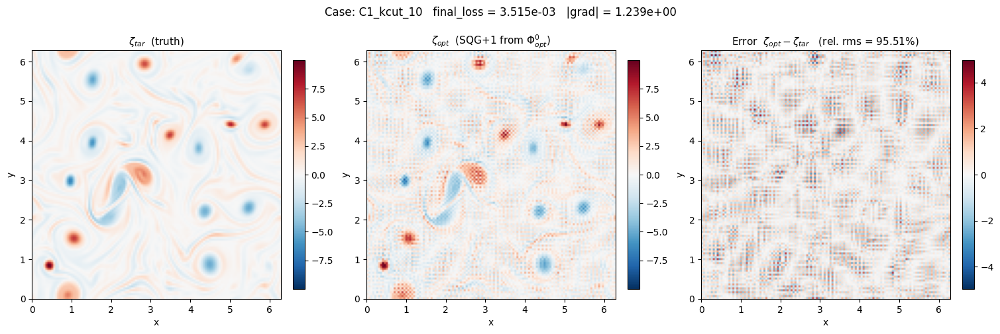

── C1_kcut_15 ──  rel. rms(ζ err) = 148.1420%


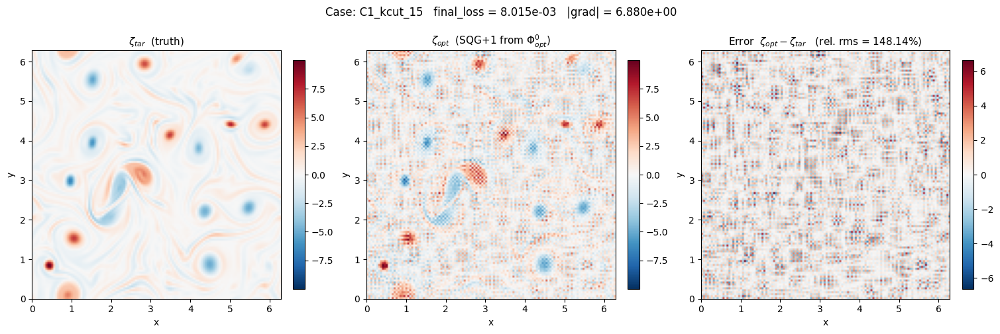

── C1_kcut_20 ──  rel. rms(ζ err) = 200.6844%


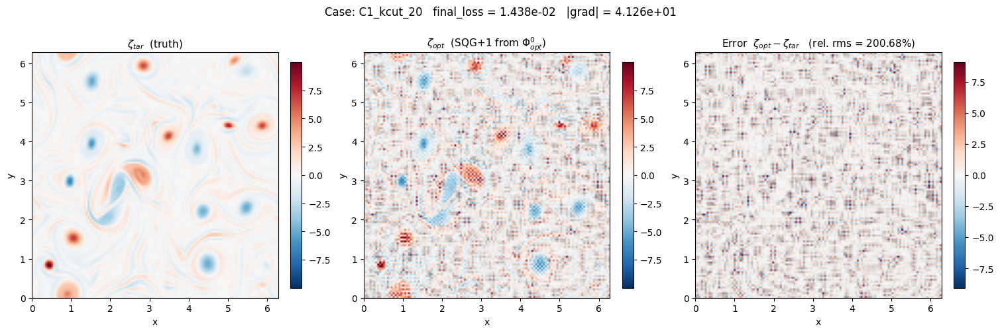

── C1_kcut_30 ──  rel. rms(ζ err) = 275.2177%


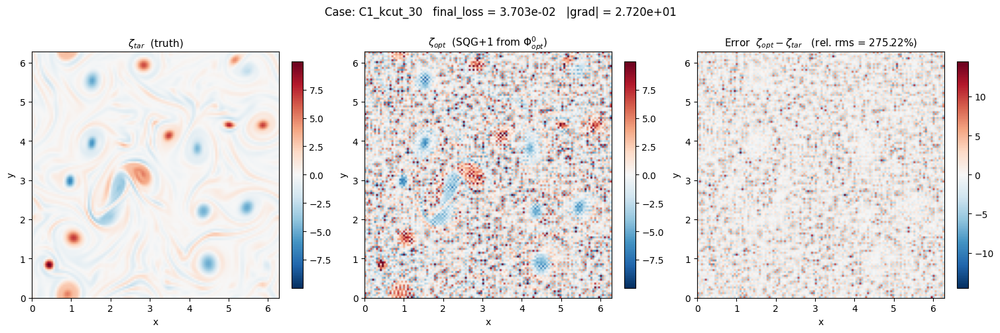

In [67]:
import os
from tkinter import Tk, filedialog

store_all = True

# ── Ask for output folder once if storing ─────────────────────────────────────
save_dir = None
if store_all:
    root = Tk(); root.withdraw(); root.attributes("-topmost", True)
    save_dir = filedialog.askdirectory(title="Choose folder to save vorticity plots")
    root.destroy()
    if not save_dir:
        print("No folder selected — plots will be shown but not saved.")
    else:
        os.makedirs(save_dir, exist_ok=True)
        print(f"Saving plots to: {save_dir}\n")


# ── Per-case recovered vorticity from SQG+1 velocity ──────────────────────────
def compute_zeta_from_phi(phi_hat):
    u, v = calculate_surface_u(phi_hat, mu, inv_mu, kx, ky, K2, inv_K2, epsilon, Bu)
    zeta = jnp.real(jnp.fft.ifft2(
        1j * kx * jnp.fft.fft2(v) - 1j * ky * jnp.fft.fft2(u)
    ))
    return u, v, zeta


# ── Reference (target) vorticity — computed once ─────────────────────────────
u_tar, v_tar, zeta_tar = compute_zeta_from_phi(phi0_s_hat)
rms_zeta_tar = float(jnp.sqrt(jnp.mean(zeta_tar ** 2)))


# ── Loop over every case ──────────────────────────────────────────────────────
extent = [0, float(Lx), 0, float(Ly)]
vmax_z = float(jnp.max(jnp.abs(zeta_tar)))

for case_name in cases.keys():
    phi0_opt_hat = jnp.fft.fft2(phi0_s_optimals[case_name])
    u_opt, v_opt, zeta_opt = compute_zeta_from_phi(phi0_opt_hat)

    zeta_err = zeta_opt - zeta_tar
    rel_zeta_err = float(jnp.sqrt(jnp.mean(zeta_err ** 2))) / rms_zeta_tar

    print(f"── {case_name} ──  rel. rms(ζ err) = {rel_zeta_err:.4%}")

    fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

    titles = [
        r"$\zeta_{tar}$  (truth)",
        r"$\zeta_{opt}$  (SQG+1 from $\Phi^0_{opt}$)",
        rf"Error  $\zeta_{{opt}} - \zeta_{{tar}}$   (rel. rms = {rel_zeta_err:.2%})",
    ]
    fields = [zeta_tar, zeta_opt, zeta_err]

    for ax, field, title in zip(axes, fields, titles):
        vmax = vmax_z if "Error" not in title else float(jnp.max(jnp.abs(zeta_err)))
        im = ax.imshow(field, origin='lower', cmap='RdBu_r',
                       vmin=-vmax, vmax=vmax, extent=extent)
        ax.set_title(title, fontsize=11)
        ax.set_xlabel("x"); ax.set_ylabel("y")
        plt.colorbar(im, ax=ax, fraction=0.046)

    fig.suptitle(
        f"Case: {case_name}   "
        f"final_loss = {benchmark_results[case_name]['final_loss']:.3e}   "
        f"|grad| = {benchmark_results[case_name]['final_grad']:.3e}",
        fontsize=12
    )

    if save_dir:
        safe_name = case_name.replace("/", "_").replace(" ", "_")
        fpath = os.path.join(save_dir, f"vorticity_{safe_name}.png")
        fig.savefig(fpath, dpi=150, bbox_inches='tight')

    plt.show()
    plt.close(fig)




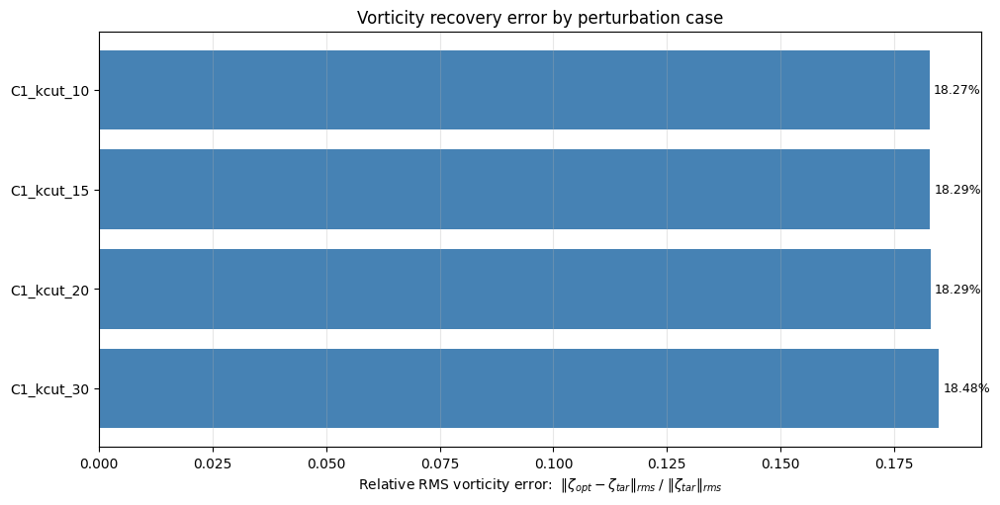

In [72]:
# ── Bar chart: relative RMS vorticity error across cases ──────────────────────
case_names_zeta = []
rel_errors_zeta = []

for case_name in cases.keys():
    phi0_opt_hat = jnp.fft.fft2(phi0_s_optimals[case_name])
    _, _, zeta_opt = compute_zeta_from_phi(phi0_opt_hat)
    zeta_err = zeta_opt - zeta_tar
    rel_err = float(jnp.sqrt(jnp.mean(zeta_err ** 2))) / rms_zeta_tar
    case_names_zeta.append(case_name)
    rel_errors_zeta.append(rel_err)

fig, ax = plt.subplots(figsize=(10, 5), constrained_layout=True)
bars = ax.barh(case_names_zeta, rel_errors_zeta, color='steelblue')
ax.set_xlabel(r"Relative RMS vorticity error:  $\| \zeta_{opt} - \zeta_{tar} \|_{rms} \;/\; \| \zeta_{tar} \|_{rms}$")
ax.set_title("Vorticity recovery error by perturbation case")
ax.invert_yaxis()

for bar, val in zip(bars, rel_errors_zeta):
    ax.text(bar.get_width() + 0.001, bar.get_y() + bar.get_height() / 2,
            f"{val:.2%}", va='center', fontsize=9)

ax.grid(True, axis='x', alpha=0.3)
plt.show()

# Evaluation Metric?

I propose we can may plot the spectral error decomposition 

$$ E(k) = \frac{|\hat{\xi}_{opt} - \hat{\xi}_{qg}|^2}{|\hat{\xi_{qg}}|^2} $$

This seperates the low-k error and High-k error. 

dk inferred from kx grid = 1.000000


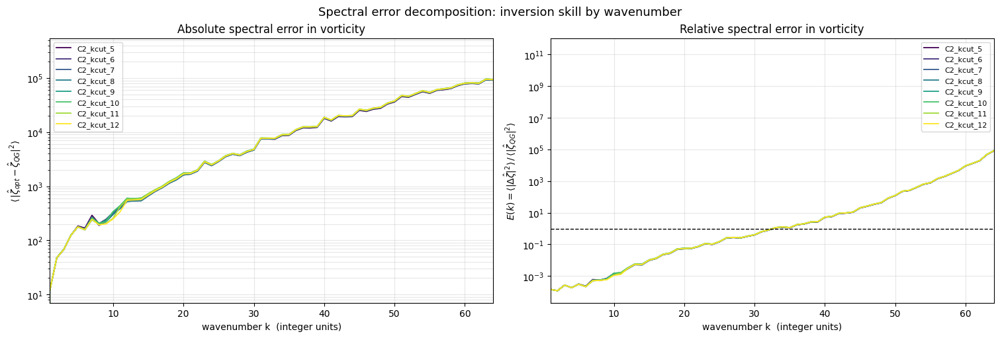

In [23]:
import matplotlib.pyplot as plt
import numpy as np

def azimuthal_spectrum(field_2d, K, dk):
    """
    Azimuthal average of a 2D spectral field, binned by integer wavenumber.
    Returns k_integers (1D) and the binned spectrum.
    """
    K_np     = np.array(K)
    field_np = np.array(np.real(field_2d))
    k_int    = np.round(K_np / dk).astype(int)
    k_max    = k_int.max()

    spectrum = np.zeros(k_max + 1)
    counts   = np.zeros(k_max + 1)
    np.add.at(spectrum, k_int.ravel(), field_np.ravel())
    np.add.at(counts,   k_int.ravel(), 1)

    counts   = np.where(counts > 0, counts, np.nan)
    spectrum = spectrum / counts
    k_axis   = np.arange(k_max + 1)
    return k_axis, spectrum


def spectral_error(phi0_opt_hat, phi0_s_hat, mu, inv_mu, kx, ky,
                   K, K2, inv_K2, epsilon, Bu, dk):
    """
    Azimuthally-averaged relative spectral error in vorticity:
        E(k) = <|ζ̂_opt(k) - ζ̂_qg(k)|²> / <|ζ̂_qg(k)|²>
    """
    zeta_qg_hat = -K2 * phi0_s_hat

    u_opt, v_opt = calculate_surface_u(phi0_opt_hat, mu, inv_mu,
                                       kx, ky, K2, inv_K2, epsilon, Bu)
    zeta_opt_hat = 1j * kx * jnp.fft.fft2(v_opt) - 1j * ky * jnp.fft.fft2(u_opt)

    err_power    = jnp.abs(zeta_opt_hat - zeta_qg_hat) ** 2
    signal_power = jnp.abs(zeta_qg_hat) ** 2

    k_axis, err_spec    = azimuthal_spectrum(err_power,    K, dk)
    _,      signal_spec = azimuthal_spectrum(signal_power, K, dk)

    with np.errstate(invalid='ignore', divide='ignore'):
        rel_spec = np.where(signal_spec > 1e-30, err_spec / signal_spec, np.nan)

    return k_axis, err_spec, signal_spec, rel_spec


# ── Infer dk directly from the kx grid used in the run ───────────────────────
# This matches whichever spectral_main convention is active (2π/Lx or 2π/Nx).
kx_np = np.array(kx)
dk = float(np.abs(kx_np[0, 1] - kx_np[0, 0]))
if dk == 0.0:
    dk = float(np.abs(kx_np[1, 0] - kx_np[0, 0]))
print(f"dk inferred from kx grid = {dk:.6f}")

# Largest integer-k bin we expect to have signal in (Nyquist in grid-k units)
k_nyquist = int(round((Nx // 2) * (float(2.0 * jnp.pi / Nx)) / dk))  # safe upper bound
k_plot_max = Nx // 2

# ── QG signal spectrum (reference, same for every case) ─────────────────────
zeta_qg_hat = -K2 * phi0_s_hat
k_axis_ref, signal_spec = azimuthal_spectrum(jnp.abs(zeta_qg_hat) ** 2, K, dk)

# ── Colour by case, robust to any naming (C1/C2/C3/E/v2) ─────────────────────
CASES_TO_PLOT = list(cases.keys())
cmap   = plt.get_cmap('viridis', max(len(CASES_TO_PLOT), 2))
colors = {name: cmap(i) for i, name in enumerate(CASES_TO_PLOT)}

fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
ax_abs, ax_rel = axes

for name in CASES_TO_PLOT:
    if name not in phi0_s_optimals:
        print(f"  skipping {name}: no optimum stored")
        continue
    phi0_opt_hat = jnp.fft.fft2(phi0_s_optimals[name])
    k_axis, err_spec, _, rel_spec = spectral_error(
        phi0_opt_hat, phi0_s_hat, mu, inv_mu,
        kx, ky, K, K2, inv_K2, epsilon, Bu, dk
    )
    ax_abs.semilogy(k_axis, err_spec, label=name, color=colors[name], lw=1.3)
    ax_rel.semilogy(k_axis, rel_spec, label=name, color=colors[name], lw=1.3)

for ax in axes:
    ax.set_xlabel("wavenumber k  (integer units)")
    ax.set_xlim(1, k_plot_max)
    ax.grid(True, which='both', alpha=0.3)
    ax.legend(fontsize=8, ncol=1, loc='best')

ax_abs.set_ylabel(r"$\langle\,|\hat{\zeta}_{opt} - \hat{\zeta}_{QG}|^2\rangle$")
ax_abs.set_title("Absolute spectral error in vorticity")

ax_rel.set_ylabel(r"$E(k) = \langle|\Delta\hat{\zeta}|^2\rangle\,/\,\langle|\hat{\zeta}_{QG}|^2\rangle$")
ax_rel.set_title("Relative spectral error in vorticity")
ax_rel.axhline(1.0, color='k', ls='--', lw=1)

fig.suptitle("Spectral error decomposition: inversion skill by wavenumber", fontsize=13)
plt.show()


In [56]:
import os
import dill
from tkinter import Tk, filedialog

to_save = {
    'benchmark_results': benchmark_results,
    'phi0_s_optimals':   phi0_s_optimals,
    'cases':             cases,
    'phi0_s':            phi0_s,
    'phi0_s_hat':        phi0_s_hat,
    'kx': kx, 'ky': ky, 'K': K, 'K2': K2, 'inv_K2': inv_K2,
    'mu': mu, 'inv_mu': inv_mu,
    'Ro': Ro, 'epsilon': epsilon, 'Bu': Bu,
    'Nx': Nx, 'Ny': Ny, 'Lx': Lx, 'Ly': Ly,
    'X': X, 'Y': Y,
}

DEFAULT_NAME = 'workspace_0413_run2_Ro_1e-3.pkl'

root = Tk(); root.withdraw(); root.attributes("-topmost", True)
save_path = filedialog.asksaveasfilename(
    title="Save workspace pickle",
    defaultextension=".pkl",
    initialfile=DEFAULT_NAME,
    filetypes=[("Pickle files", "*.pkl"), ("All files", "*.*")],
)
root.destroy()

if not save_path:
    print("Save cancelled — nothing written.")
else:
    os.makedirs(os.path.dirname(save_path) or ".", exist_ok=True)
    with open(save_path, 'wb') as f:
        dill.dump(to_save, f)
    print(f"Workspace saved to: {save_path}")


Workspace saved to: D:/Documents/College/Research/Oceangrophy/Shafer_Project/Output/Benchmark Result/0413/C2_Vary/Run1_Ro_1e-3/workspace_0413_run2_Ro_1e-3.pkl
